In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his/')

In [10]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [11]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_dreamz_3chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-959.57260703]
 [-695.17653586]
 [-695.17653586]
 ..., 
 [ 105.01607046]
 [ 105.01607046]
 [ 105.01607046]]
Logp of trace:  a  chain:  1  =  [ 104.67666608]
Logp of trace:  a  chain:  2  =  [ 103.76045625]
Logp of trace:  b  chain: 0 =  [[-1720.96520429]
 [-1720.96520429]
 [-1720.96520429]
 ..., 
 [  105.47855639]
 [  105.47855639]
 [  105.47855639]]
Logp of trace:  b  chain:  1  =  [ 104.37041329]
Logp of trace:  b  chain:  2  =  [ 101.90613301]
Logp of trace:  c  chain: 0 =  [[-2558.15236304]
 [-2558.15236304]
 [-2433.73097353]
 ..., 
 [  104.97111625]
 [  104.97111625]
 [  104.97111625]]
Logp of trace:  c  chain:  1  =  [ 103.16492937]
Logp of trace:  c  chain:  2  =  [ 106.66462323]
Logp of trace:  d  chain: 0 =  [[-1895.26626399]
 [ -803.00717875]
 [ -432.38704478]
 ..., 
 [  108.28002142]
 [  108.28002142]
 [  108.28002142]]
Logp of trace:  d  chain:  1  =  [ 106.31217064]
Logp of trace:  d  chain:  2  =  [ 102.99748702]


In [6]:
traces['a'][0][:,72]

array([-1.27163693, -1.05347151, -1.05347151, ..., -2.83612997,
       -2.83612997, -2.83612997])

In [12]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [8]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  50  of  105  parameters.
Percent of parameters with GR below 1.2:  47.619047619
Number of parameters with GR below 1.1:  30  of  105  parameters.
Percent of parameters with GR below 1.1:  28.5714285714


[50, 47.61904761904761, 30, 28.57142857142857]

In [13]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  76  of  105  parameters.
Percent of parameters with GR below 1.2:  72.380952381
Number of parameters with GR below 1.1:  45  of  105  parameters.
Percent of parameters with GR below 1.1:  42.8571428571


[76, 72.38095238095238, 45, 42.857142857142854]

In [14]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  82  of  105  parameters.
Percent of parameters with GR below 1.2:  78.0952380952
Number of parameters with GR below 1.1:  48  of  105  parameters.
Percent of parameters with GR below 1.1:  45.7142857143


[82, 78.0952380952381, 48, 45.714285714285715]

In [15]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  63  of  105  parameters.
Percent of parameters with GR below 1.2:  60.0
Number of parameters with GR below 1.1:  33  of  105  parameters.
Percent of parameters with GR below 1.1:  31.4285714286


[63, 60.0, 33, 31.428571428571427]

50000
3
50000


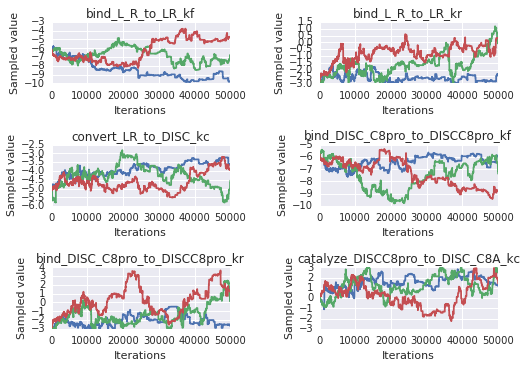

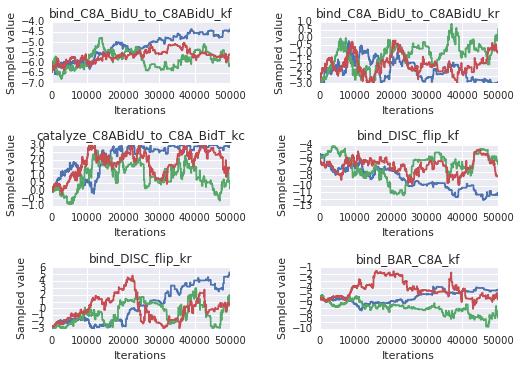

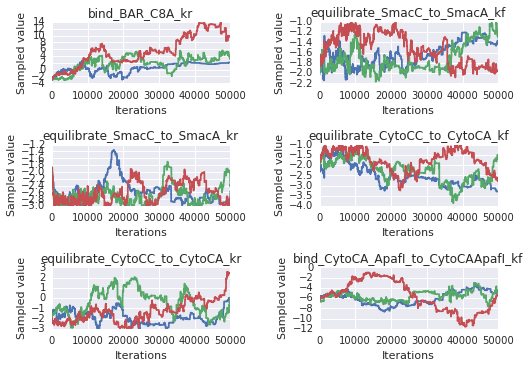

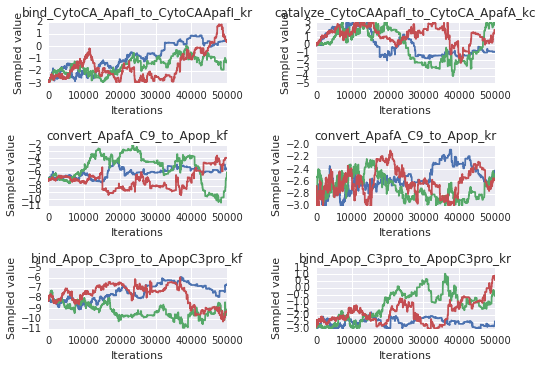

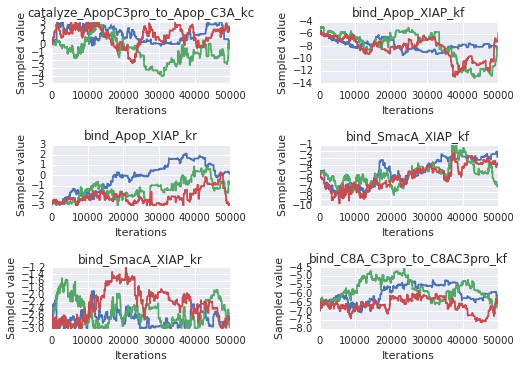

...

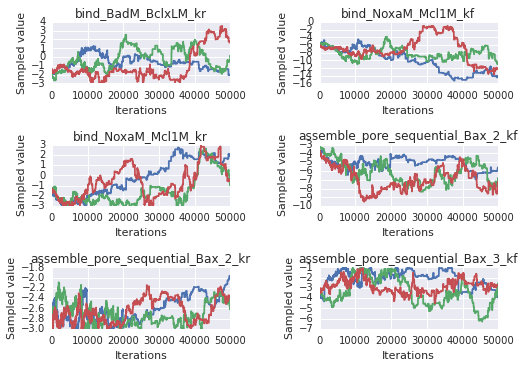

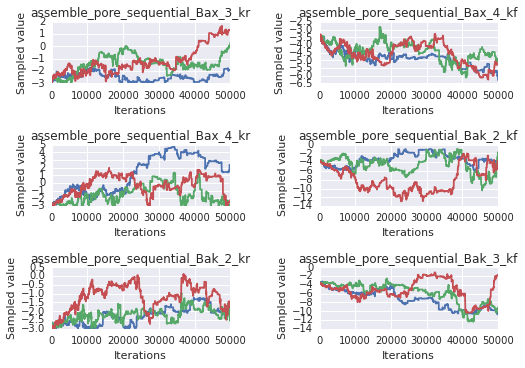

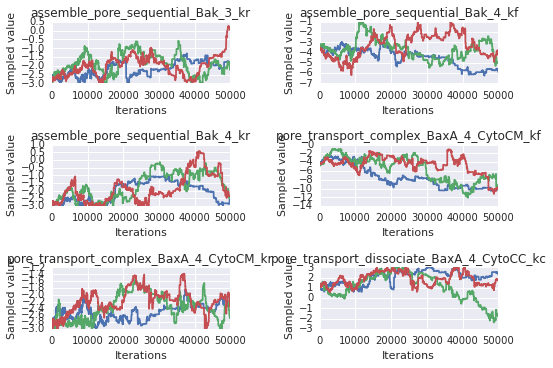

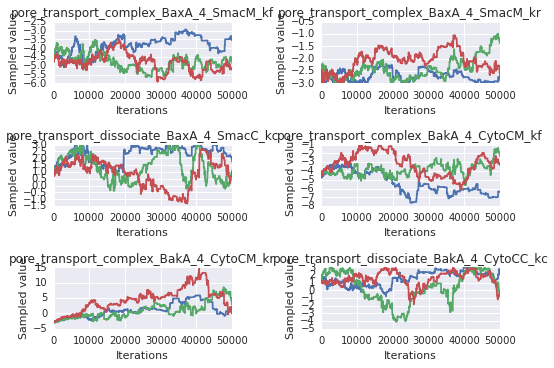

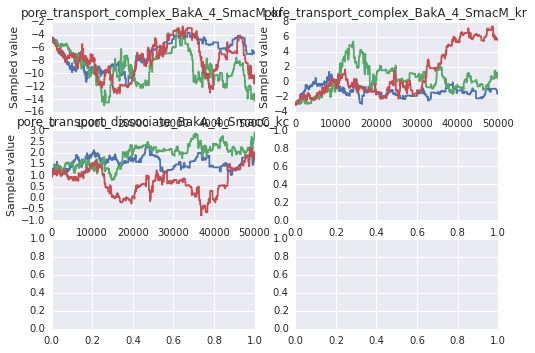

In [16]:
sample_plots(param_trace_dicts['a'])

In [18]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=10000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=10000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=10000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=10000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


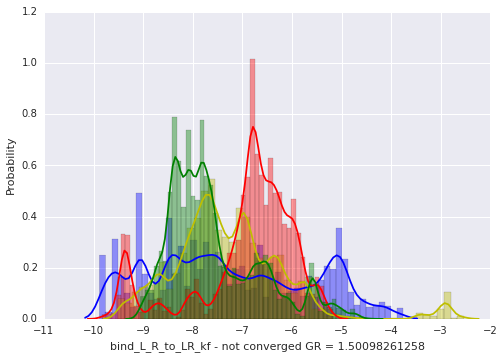

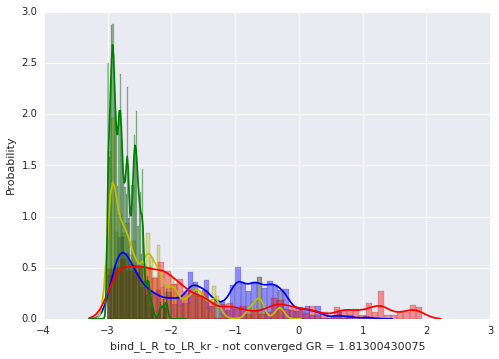

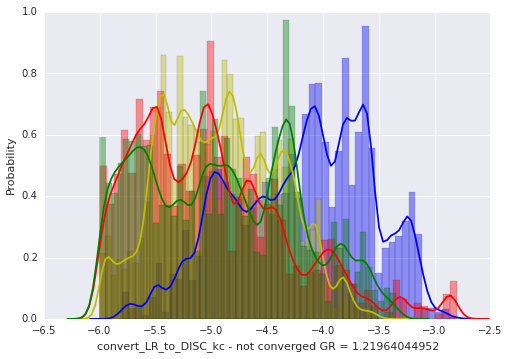

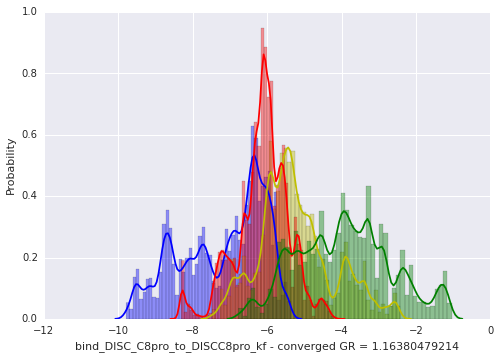

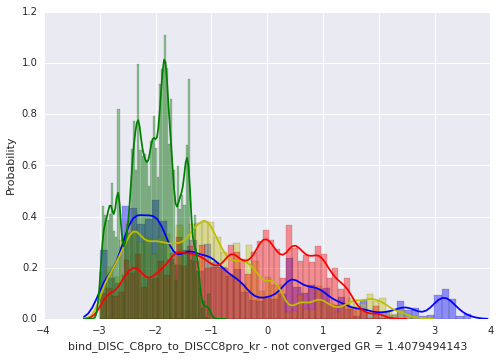

...

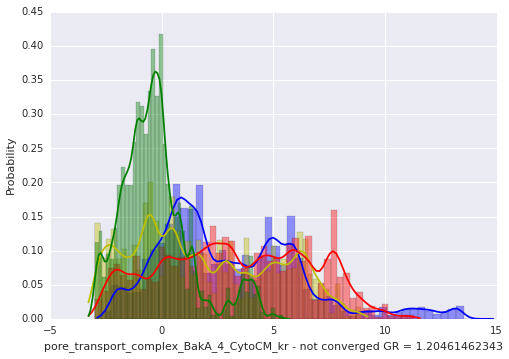

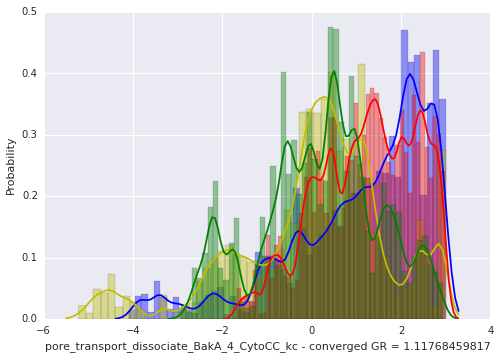

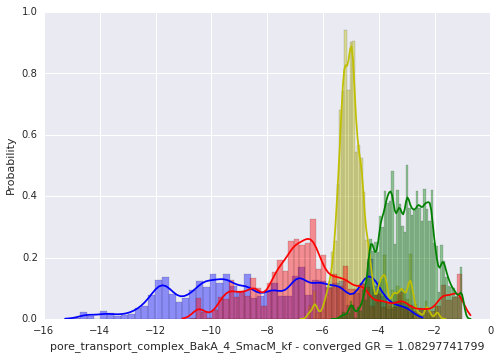

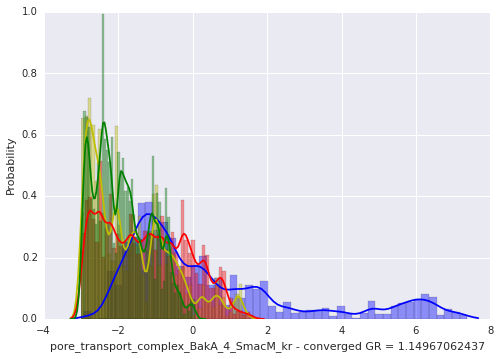

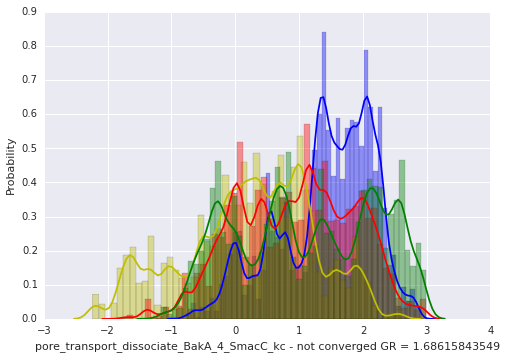

In [19]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [20]:
traces['a'][1][:,0]

array([-6.32387004, -6.32387004, -6.32387004, ..., -6.9202911 ,
       -6.9202911 , -6.9202911 ])

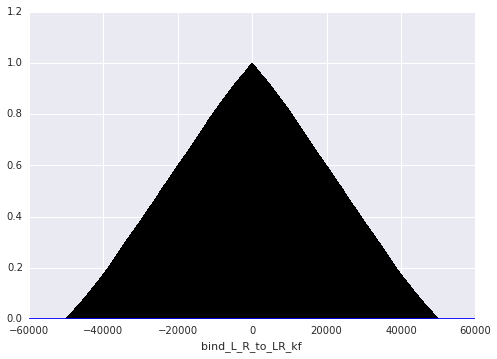

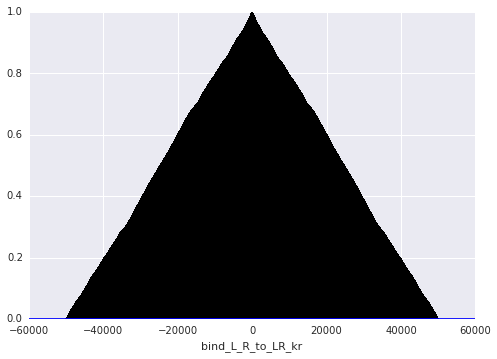

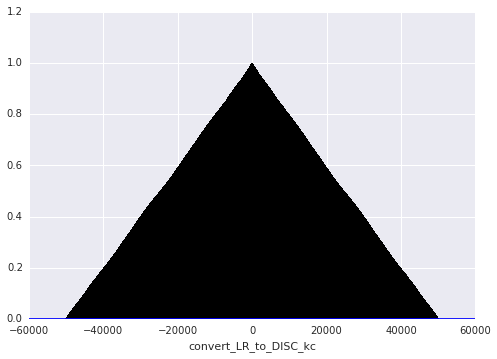

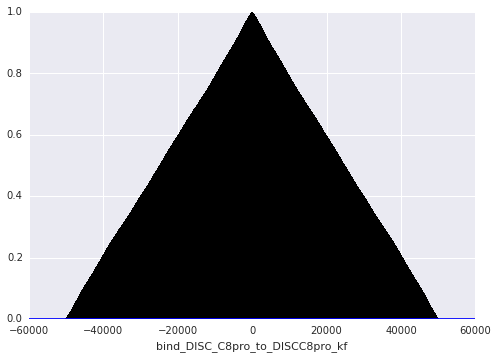

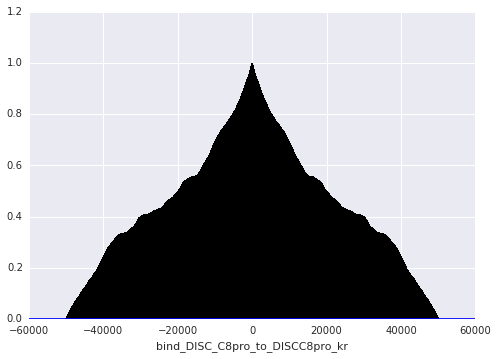

...

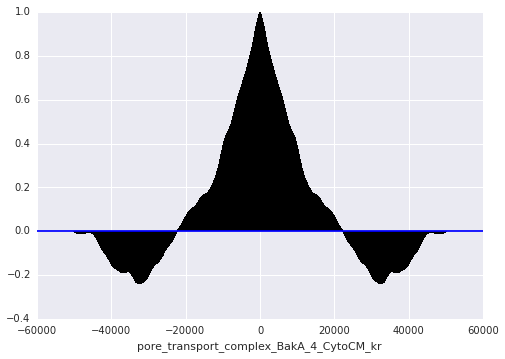

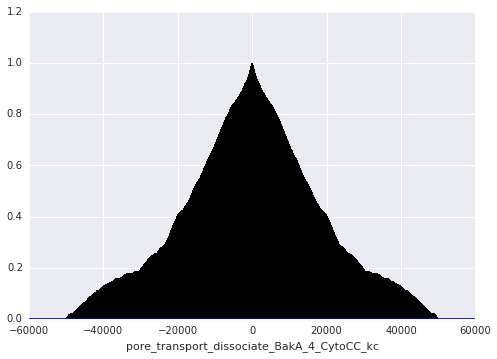

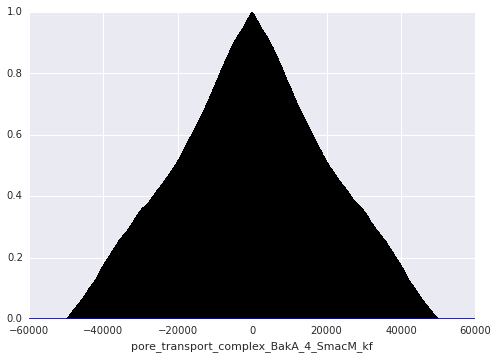

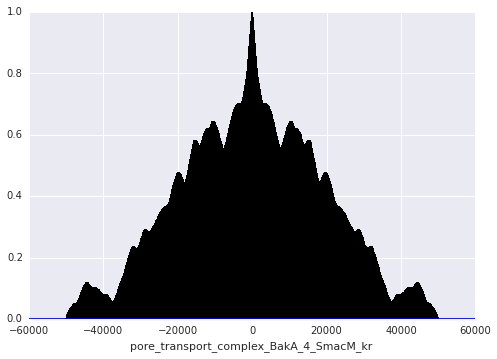

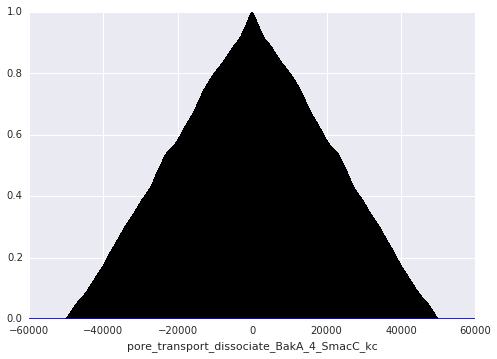

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

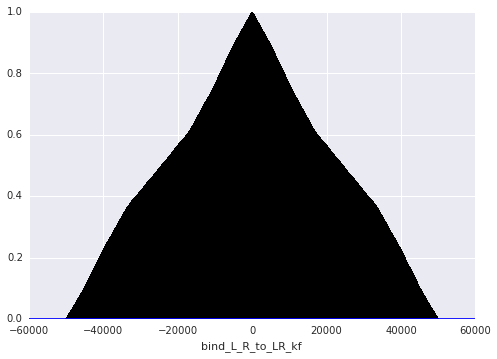

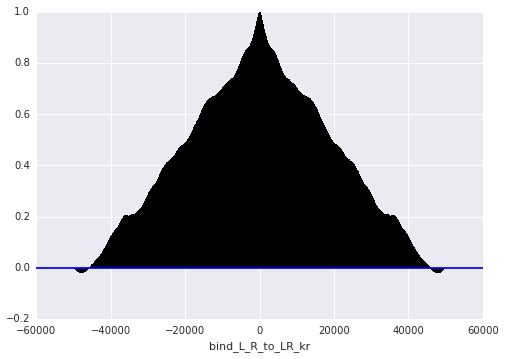

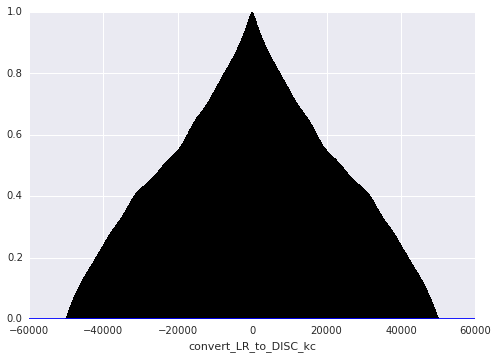

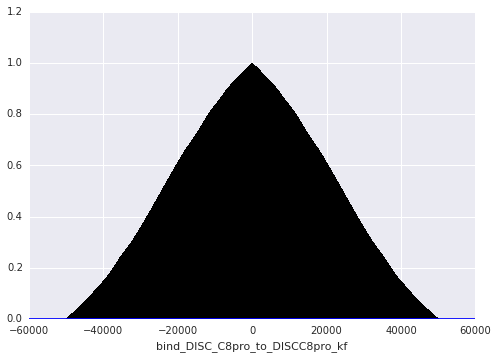

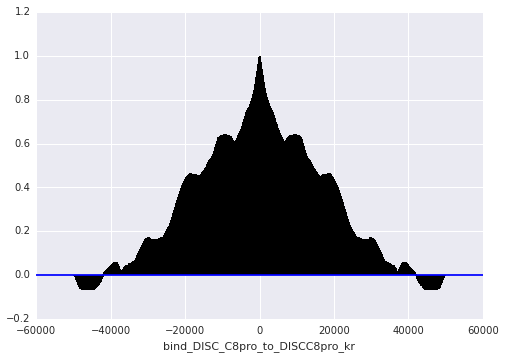

...

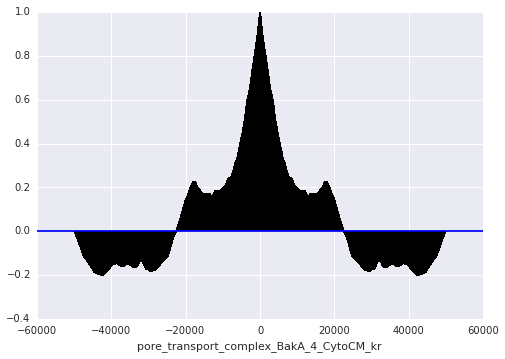

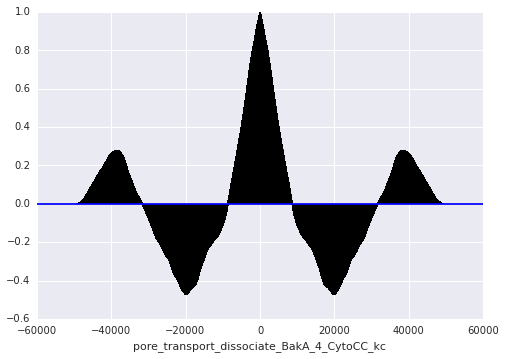

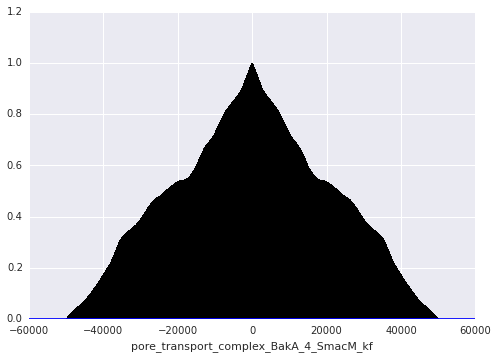

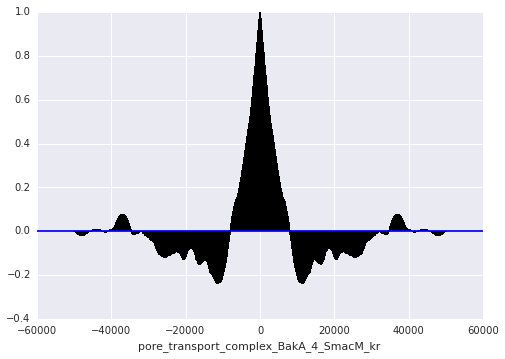

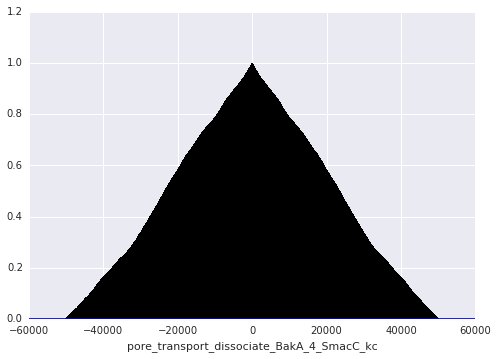

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

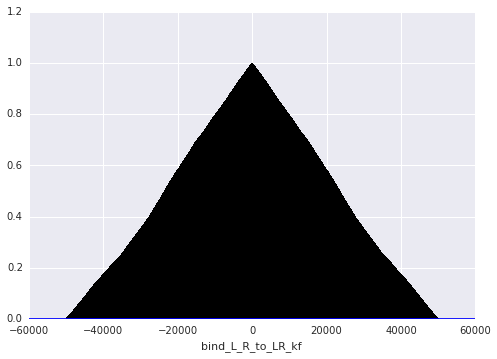

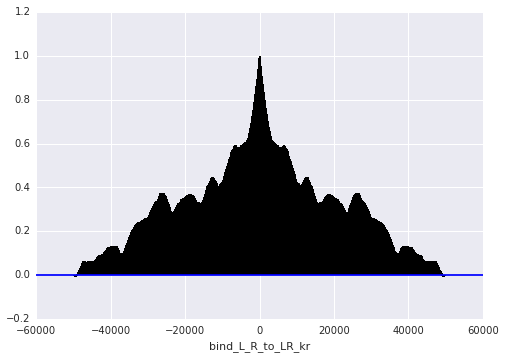

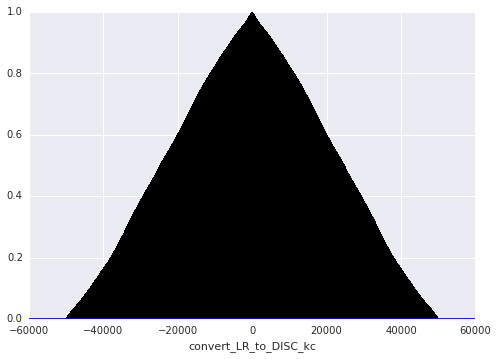

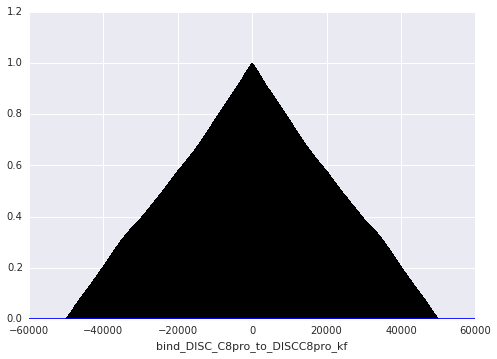

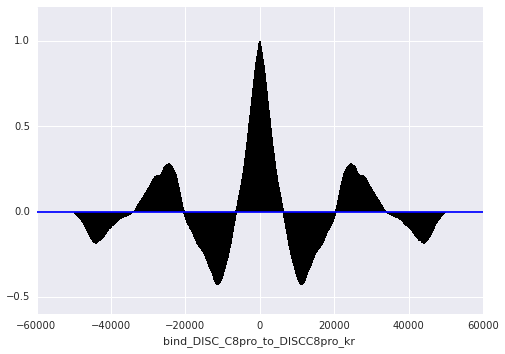

...

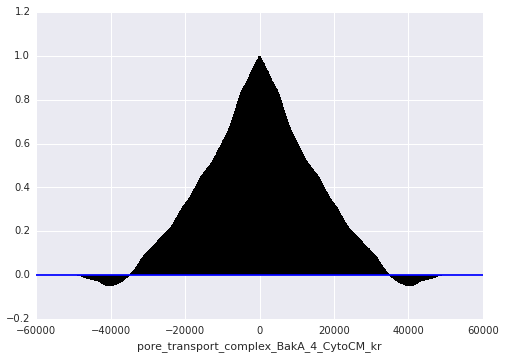

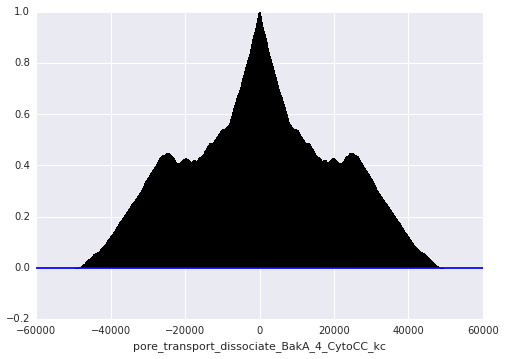

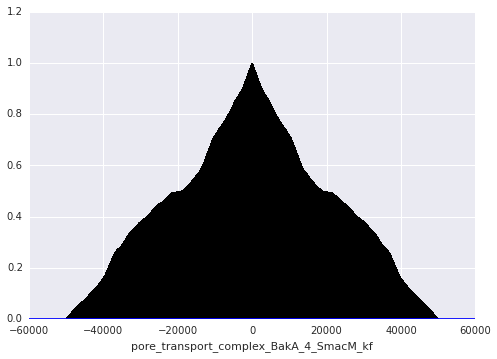

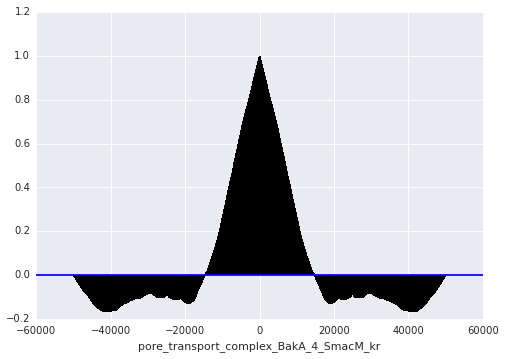

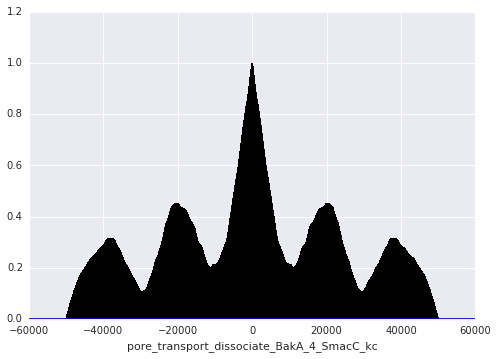

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [24]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  882  acceptance rate:  0.01764
N acceptances for parameter:  bind_L_R_to_LR_kr  =  928  acceptance rate:  0.01856
N acceptances for parameter:  convert_LR_to_DISC_kc  =  889  acceptance rate:  0.01778
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  887  acceptance rate:  0.01774
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  925  acceptance rate:  0.0185
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  934  acceptance rate:  0.01868
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  906  acceptance rate:  0.01812
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  920  acceptance rate:  0.0184
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  923  acceptance rate:  0.01846
N acceptances for parameter:  bind_DISC_flip_kf  =  928  acceptance rate:  0.01856
N acceptances for parameter:  bind_DISC_flip_kr  =  933  acceptance rate:  0.01866
N accep

array([ 0.01764,  0.01856,  0.01778,  0.01774,  0.0185 ,  0.01868,
        0.01812,  0.0184 ,  0.01846,  0.01856,  0.01866,  0.01802,
        0.01788,  0.0182 ,  0.01816,  0.0183 ,  0.01878,  0.0188 ,
        0.01822,  0.01868,  0.01808,  0.01802,  0.01844,  0.01856,
        0.01812,  0.01856,  0.01848,  0.01816,  0.01848,  0.0177 ,
        0.0181 ,  0.01876,  0.01834,  0.0189 ,  0.01798,  0.0178 ,
        0.0181 ,  0.01856,  0.0181 ,  0.01816,  0.01844,  0.01822,
        0.01802,  0.01864,  0.01828,  0.01804,  0.0173 ,  0.01812,
        0.01852,  0.01792,  0.01892,  0.01798,  0.01816,  0.01876,
        0.01846,  0.01858,  0.01814,  0.01852,  0.0182 ,  0.01896,
        0.01838,  0.01822,  0.0186 ,  0.0189 ,  0.01846,  0.01794,
        0.01864,  0.01816,  0.0179 ,  0.01878,  0.01802,  0.01802,
        0.01808,  0.01826,  0.01866,  0.01826,  0.01816,  0.0186 ,
        0.01842,  0.01864,  0.01878,  0.01804,  0.01848,  0.01816,
        0.019  ,  0.01824,  0.01844,  0.0182 ,  0.01876,  0.01

In [25]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1098  acceptance rate:  0.02196
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1139  acceptance rate:  0.02278
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1091  acceptance rate:  0.02182
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1036  acceptance rate:  0.02072
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1114  acceptance rate:  0.02228
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1120  acceptance rate:  0.0224
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1069  acceptance rate:  0.02138
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1089  acceptance rate:  0.02178
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1101  acceptance rate:  0.02202
N acceptances for parameter:  bind_DISC_flip_kf  =  1101  acceptance rate:  0.02202
N acceptances for parameter:  bind_DISC_flip_kr  =  1114  acceptance rate:  0.0

array([ 0.02196,  0.02278,  0.02182,  0.02072,  0.02228,  0.0224 ,
        0.02138,  0.02178,  0.02202,  0.02202,  0.02228,  0.02174,
        0.02258,  0.02192,  0.02254,  0.02238,  0.02242,  0.02244,
        0.02256,  0.0221 ,  0.02256,  0.0225 ,  0.02218,  0.02278,
        0.0223 ,  0.02236,  0.02212,  0.02252,  0.02228,  0.02176,
        0.02266,  0.02194,  0.02146,  0.02218,  0.02226,  0.02222,
        0.02222,  0.02206,  0.02162,  0.02268,  0.02268,  0.02162,
        0.02248,  0.02294,  0.0226 ,  0.02196,  0.02206,  0.02214,
        0.0225 ,  0.02252,  0.02212,  0.02284,  0.02222,  0.02198,
        0.0222 ,  0.02212,  0.02252,  0.0227 ,  0.02198,  0.02264,
        0.0226 ,  0.02186,  0.0227 ,  0.02218,  0.0224 ,  0.0222 ,
        0.02258,  0.02182,  0.0225 ,  0.02228,  0.02226,  0.02258,
        0.02212,  0.02256,  0.02294,  0.02258,  0.02232,  0.02218,
        0.02188,  0.02236,  0.02176,  0.0226 ,  0.02246,  0.02206,
        0.02276,  0.02298,  0.02238,  0.02268,  0.0224 ,  0.02

In [26]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1146  acceptance rate:  0.02292
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1183  acceptance rate:  0.02366
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1137  acceptance rate:  0.02274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1086  acceptance rate:  0.02172
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1181  acceptance rate:  0.02362
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1172  acceptance rate:  0.02344
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1124  acceptance rate:  0.02248
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1170  acceptance rate:  0.0234
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1182  acceptance rate:  0.02364
N acceptances for parameter:  bind_DISC_flip_kf  =  1161  acceptance rate:  0.02322
N acceptances for parameter:  bind_DISC_flip_kr  =  1176  acceptance rate:  0.0

array([ 0.02292,  0.02366,  0.02274,  0.02172,  0.02362,  0.02344,
        0.02248,  0.0234 ,  0.02364,  0.02322,  0.02352,  0.02346,
        0.02296,  0.02332,  0.0236 ,  0.02364,  0.02362,  0.02398,
        0.02374,  0.02342,  0.02356,  0.02316,  0.0237 ,  0.02354,
        0.024  ,  0.02304,  0.02376,  0.02334,  0.02404,  0.02282,
        0.0236 ,  0.02296,  0.02274,  0.02396,  0.02386,  0.0233 ,
        0.02394,  0.02242,  0.02236,  0.02376,  0.02392,  0.02378,
        0.02368,  0.0231 ,  0.02394,  0.02376,  0.02388,  0.02348,
        0.02274,  0.02228,  0.02392,  0.02362,  0.02352,  0.02314,
        0.0236 ,  0.02406,  0.02418,  0.0236 ,  0.02344,  0.02388,
        0.0237 ,  0.02348,  0.02354,  0.0231 ,  0.02328,  0.02282,
        0.0233 ,  0.02366,  0.02368,  0.0241 ,  0.02364,  0.0236 ,
        0.02332,  0.02362,  0.02346,  0.02398,  0.02314,  0.02358,
        0.0235 ,  0.02322,  0.02304,  0.02326,  0.02334,  0.02328,
        0.0237 ,  0.02372,  0.0237 ,  0.02326,  0.02398,  0.02

In [27]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1146  acceptance rate:  0.02292
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1183  acceptance rate:  0.02366
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1137  acceptance rate:  0.02274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1086  acceptance rate:  0.02172
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1181  acceptance rate:  0.02362
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1172  acceptance rate:  0.02344
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1124  acceptance rate:  0.02248
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1170  acceptance rate:  0.0234
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1182  acceptance rate:  0.02364
N acceptances for parameter:  bind_DISC_flip_kf  =  1161  acceptance rate:  0.02322
N acceptances for parameter:  bind_DISC_flip_kr  =  1176  acceptance rate:  0.0

array([ 0.02292,  0.02366,  0.02274,  0.02172,  0.02362,  0.02344,
        0.02248,  0.0234 ,  0.02364,  0.02322,  0.02352,  0.02346,
        0.02296,  0.02332,  0.0236 ,  0.02364,  0.02362,  0.02398,
        0.02374,  0.02342,  0.02356,  0.02316,  0.0237 ,  0.02354,
        0.024  ,  0.02304,  0.02376,  0.02334,  0.02404,  0.02282,
        0.0236 ,  0.02296,  0.02274,  0.02396,  0.02386,  0.0233 ,
        0.02394,  0.02242,  0.02236,  0.02376,  0.02392,  0.02378,
        0.02368,  0.0231 ,  0.02394,  0.02376,  0.02388,  0.02348,
        0.02274,  0.02228,  0.02392,  0.02362,  0.02352,  0.02314,
        0.0236 ,  0.02406,  0.02418,  0.0236 ,  0.02344,  0.02388,
        0.0237 ,  0.02348,  0.02354,  0.0231 ,  0.02328,  0.02282,
        0.0233 ,  0.02366,  0.02368,  0.0241 ,  0.02364,  0.0236 ,
        0.02332,  0.02362,  0.02346,  0.02398,  0.02314,  0.02358,
        0.0235 ,  0.02322,  0.02304,  0.02326,  0.02334,  0.02328,
        0.0237 ,  0.02372,  0.0237 ,  0.02326,  0.02398,  0.02